In [1]:
import numpy as np
from numpy import linalg as la
import pandas as pd
from PIL import Image
import matplotlib.pyplot as plt
%matplotlib inline
np.set_printoptions(precision=5, suppress=True)
import pandas as pd
import numpy as np
import re
import sklearn
import xgboost as xgb
import seaborn as sns
import matplotlib.pyplot as plt
%matplotlib inline

import plotly.offline as py
py.init_notebook_mode(connected=True)
import plotly.graph_objs as go
import plotly.tools as tls

import warnings
warnings.filterwarnings('ignore')

# Going to use these 5 base models for the stacking
from sklearn.ensemble import (RandomForestClassifier, AdaBoostClassifier, 
                              GradientBoostingClassifier, ExtraTreesClassifier)
from sklearn.svm import SVC
from sklearn.cross_validation import KFold
import plotly.offline as py
py.init_notebook_mode(connected=True)
from plotly.offline import init_notebook_mode, iplot
init_notebook_mode(connected=True)
import plotly.graph_objs as go
import plotly.offline as offline
offline.init_notebook_mode()
from plotly import tools

# import cufflinks and offline mode
import cufflinks as cf
cf.go_offline()

In [2]:
raw_data = pd.read_table('DS/SVD/cancel_before_answer_cityid.csv',
                        sep='\t', header=0)
raw_data.head()

,a.grid_id,cancel_rate_1,cancel_rate_2,cancel_rate_3,cancel_rate_4,cancel_rate_5,cancel_rate_6,cancel_rate_7,cancel_rate_8,cancel_rate_9,...,cancel_rate_135,cancel_rate_136,cancel_rate_137,cancel_rate_138,cancel_rate_139,cancel_rate_140,cancel_rate_141,cancel_rate_142,cancel_rate_143,cancel_rate_144
0,OL13F1i4945j2561,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,1.0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
1,OL13F1i4945j2562,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
2,OL13F1i4946j2561,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
3,OL13F1i4946j2562,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
4,OL13F1i4947j2560,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN


In [3]:
raw_data.shape

(6030, 145)

In [4]:
data = pd.DataFrame(raw_data)

In [5]:
def fill_na(model):
    for c in model.columns:
        model[c] = model[c].fillna(0)
fill_na(data)

In [6]:
data.head()

,a.grid_id,cancel_rate_1,cancel_rate_2,cancel_rate_3,cancel_rate_4,cancel_rate_5,cancel_rate_6,cancel_rate_7,cancel_rate_8,cancel_rate_9,...,cancel_rate_135,cancel_rate_136,cancel_rate_137,cancel_rate_138,cancel_rate_139,cancel_rate_140,cancel_rate_141,cancel_rate_142,cancel_rate_143,cancel_rate_144
0,OL13F1i4945j2561,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
1,OL13F1i4945j2562,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
2,OL13F1i4946j2561,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
3,OL13F1i4946j2562,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
4,OL13F1i4947j2560,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0


In [7]:
data.describe()

,cancel_rate_1,cancel_rate_2,cancel_rate_3,cancel_rate_4,cancel_rate_5,cancel_rate_6,cancel_rate_7,cancel_rate_8,cancel_rate_9,cancel_rate_10,...,cancel_rate_135,cancel_rate_136,cancel_rate_137,cancel_rate_138,cancel_rate_139,cancel_rate_140,cancel_rate_141,cancel_rate_142,cancel_rate_143,cancel_rate_144
count,6030.000000,6030.000000,6030.000000,6030.000000,6030.000000,6030.000000,6030.000000,6030.000000,6030.000000,6030.000000,...,6030.000000,6030.000000,6030.000000,6030.000000,6030.000000,6030.000000,6030.000000,6030.000000,6030.000000,6030.000000
mean,0.048594,0.049673,0.046638,0.042926,0.039022,0.038220,0.040093,0.032886,0.038883,0.033889,...,0.066900,0.063757,0.059348,0.053662,0.052533,0.052714,0.047930,0.048923,0.042589,0.035291
std,0.162956,0.165520,0.160661,0.153699,0.146081,0.147996,0.154426,0.136051,0.155073,0.138730,...,0.184577,0.181234,0.174364,0.167249,0.166682,0.168718,0.157729,0.163975,0.156879,0.135634
min,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,...,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
25%,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,...,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
50%,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,...,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
75%,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,...,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
max,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,...,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000


In [8]:
x = data.iloc[:, 1:].values

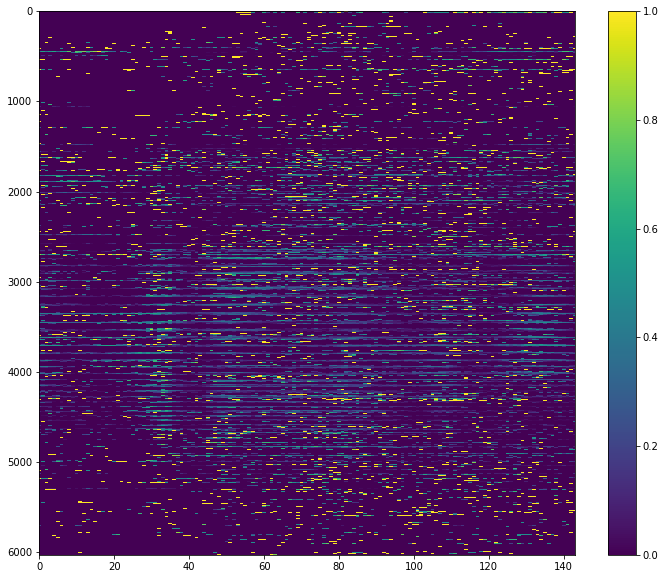

In [9]:
plt.figure(figsize=(12,10))
plt.imshow(x[:, :], aspect='auto')
plt.xlim(0,143)
plt.colorbar()
plt.show()

from sklearn.feature_extraction.text import TfidfTransformer # used to capture outliers and assign more weights 
vectorizer = TfidfTransformer() 
X = vectorizer.fit_transform(np.array(x)).toarray()

In [10]:
from sklearn.decomposition import NMF
model = NMF(n_components=6, init='random', random_state=0)
W = model.fit_transform(x)
H = model.components_

In [11]:
print(W.shape)
print(H.shape)

(6030, 6)
(6, 144)


In [12]:
print(model.reconstruction_err_)

153.74007906488788


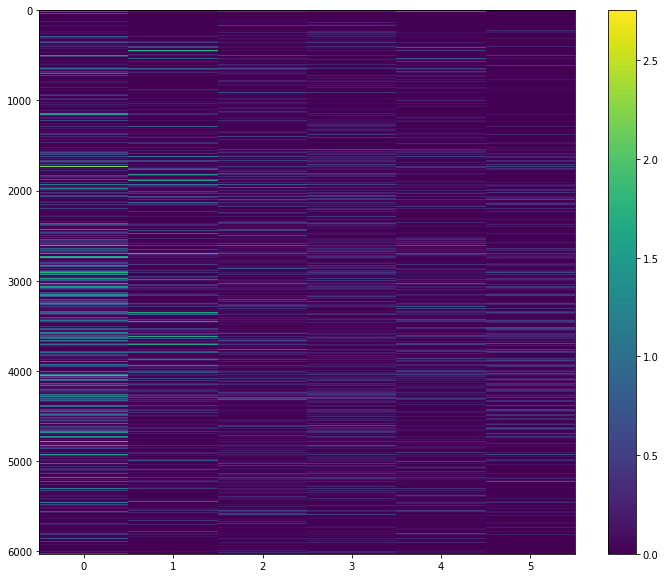

In [13]:
plt.figure(figsize=(12,10))
plt.imshow(W[:, :], aspect='auto')
plt.xlim(-0.5,5.5)
plt.colorbar()
plt.show()

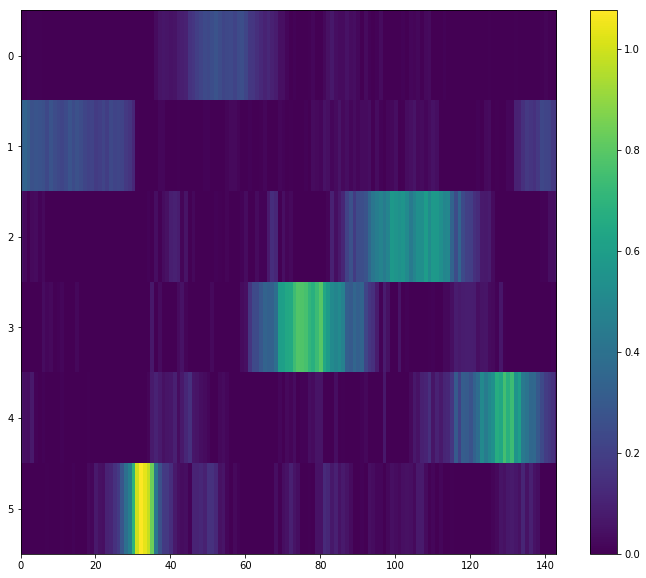

In [14]:
plt.figure(figsize=(12,10))
plt.imshow(H[:, :], aspect='auto')
plt.xlim(0,143)
plt.colorbar()
plt.show()

In [15]:
data['class'] = np.argmax(W, axis=1)

In [16]:
data['class'].value_counts()

0    2872
2     845
1     791
3     660
4     550
5     312
Name: class, dtype: int64

In [18]:
data2 = pd.read_table('DS/SVD/cancel_before_answer_cityid.csv',
                        sep='\t', header=0)

In [23]:
mis_val = data2.iloc[:, 1:].isnull().sum(axis=1)

In [24]:
mis_percent = 100*data2.iloc[:, 1:].isnull().sum(axis=1)/data2.iloc[:, 1:].shape[1]

In [25]:
mis_val_table = pd.concat([mis_val, mis_percent], axis=1)

In [26]:
mis_val_table = mis_val_table.rename(columns={0:'missing_values', 1:'missing_percentages'})

In [28]:
data2 = pd.concat([data2, mis_val_table], axis=1)

In [29]:
data_selected = data2.query('missing_percentages <= 50')

In [30]:
data_selected.shape

(2269, 147)

In [42]:
data_selected = data_selected.fillna(0)

In [43]:
x2 = data_selected.iloc[:, 1:-2].values

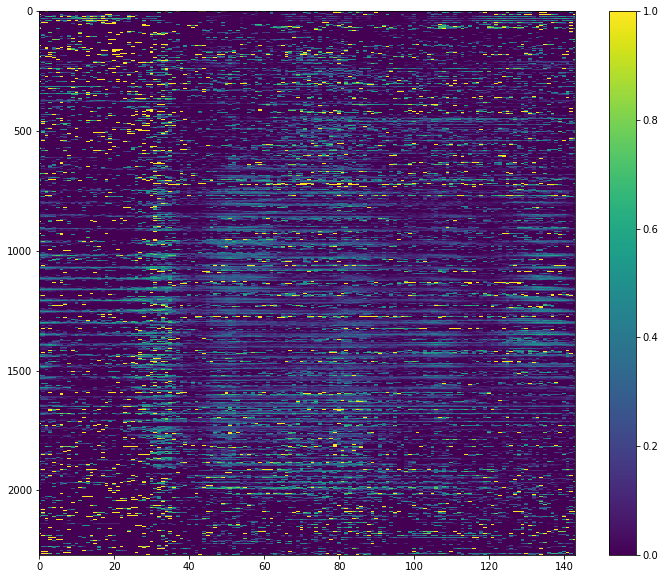

In [44]:
plt.figure(figsize=(12,10))
plt.imshow(x2[:, :], aspect='auto')
plt.xlim(0,143)
plt.colorbar()
plt.show()

In [64]:
model2 = NMF(n_components=6, init='random', random_state=0)
W2 = model2.fit_transform(x2)
H2 = model2.components_

In [76]:
print(model2.reconstruction_err_)

92.02479186241847


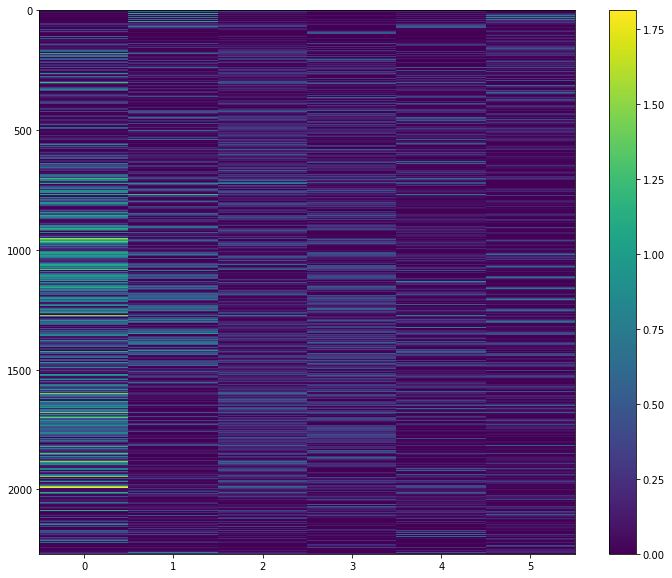

In [65]:
plt.figure(figsize=(12,10))
plt.imshow(W2[:, :], aspect='auto')
plt.xlim(-0.5,5.5)
plt.colorbar()
plt.show()

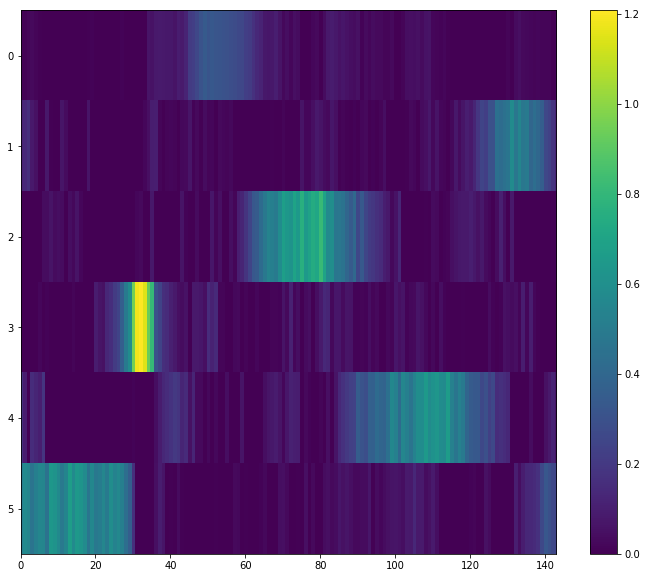

In [66]:
plt.figure(figsize=(12,10))
plt.imshow(H2[:, :], aspect='auto')
plt.xlim(0,143)
plt.colorbar()
plt.show()

In [72]:
data_selected['class'] = np.argmax(W2, axis=1)

In [73]:
data_selected['class'].value_counts()

0    1140
1     366
3     262
5     221
2     174
4     106
Name: class, dtype: int64

In [74]:
data_selected[['a.grid_id', 'class']].to_csv('grid_nmf_2.csv')

In [77]:
W2

array([[0.71151, 1.40006, 0.28321, 0.     , 0.58327, 0.     ],
       [0.82167, 0.00548, 0.28346, 0.1935 , 0.06408, 0.18347],
       [0.85146, 0.20903, 0.14242, 0.11758, 0.     , 0.1944 ],
       ...,
       [0.27504, 0.208  , 0.22071, 0.14795, 0.02776, 0.     ],
       [0.07565, 0.19121, 0.04062, 0.     , 0.47727, 0.     ],
       [0.23202, 0.81613, 0.46419, 0.36007, 0.08946, 0.34064]])